<a href="https://colab.research.google.com/github/PGPradhan/Lead-Source-Tracking/blob/main/Lead_Source_identification(CRM).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Importing libraries
import numpy as np
import pandas as pd
#from sklearn.preprocessing import PowerTransformer
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# visulaisation
from matplotlib.pyplot import xticks
%matplotlib inline

In [ ]:
# Data display coustomization
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
lead = pd.read_csv(r"/content/leadsource_md.csv")
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity,Unnamed: 37
0,1,1.0,Email,Olark Chat,No,No,0.0,0.0,15.0,0.0,Email Open,Afghanistan,ORGGEN TECHNOLOGIES LLP,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Select,Bombuflat,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
1,2,1.0,Email,Organic Search,No,No,0.0,5.0,15.0,2.5,Email Open,Albania,xyz,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Select,Garacharma,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
2,3,1.0,Email,Direct Traffic,No,No,0.0,2.0,15.0,2.0,Email Open,Algeria,NaN,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Select,Port Blair,02.Medium,01.High,14.0,20.0,No,Yes,Email Open,NaN
3,4,1.0,Email,Direct Traffic,No,No,0.0,1.0,15.0,1.0,Email Open,American Samoa,NaN,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Low in Relevance,No,No,Select,Rangat,02.Medium,01.High,13.0,17.0,No,No,Email Open,NaN
4,5,1.0,Email,Google,No,No,0.0,2.0,15.0,1.0,Email Open,Andorra,NaN,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Low in Relevance,No,No,Select,Addanki,02.Medium,01.High,15.0,18.0,No,No,Email Open,NaN


In [ ]:
# word=pd.read_excel(r"/content/Leads Data Dictionary.xlsx")
# word.head()

In [ ]:
# pd.set_option('display.max_colwidth', -1)
# word.drop('Unnamed: 0',inplace=True,axis=1)
# word.columns = word.iloc[1]
# word = word.iloc[2:]
# word.reset_index(drop=True, inplace=True)
# word.head(len(word))

1,Variables,Description
0,Prospect ID,A unique ID with which the customer is identified.
1,Lead Number,A lead number assigned to each lead procured.
2,Lead Origin,"The origin identifier with which the customer was identified to be a lead. Includes API, Landing Page Submission, etc."
3,Lead Source,"The source of the lead. Includes Google, Organic Search, Olark Chat, etc."
4,Do Not Email,An indicator variable selected by the customer wherein they select whether of not they want to be emailed about the course or not.
5,Do Not Call,An indicator variable selected by the customer wherein they select whether of not they want to be called about the course or not.
6,Converted,The target variable. Indicates whether a lead has been successfully converted or not.
7,TotalVisits,The total number of visits made by the customer on the website.
8,Total Time Spent on Website,The total time spent by the customer on the website.
9,Page Views Per Visit,Average number of pages on the website viewed during the visits.


Remove Columns which are now generated after we call a lead

In [ ]:
# lead.drop(['Asymmetrique Activity Index','Asymmetrique Profile Index',
#            'Asymmetrique Activity Score','Asymmetrique Profile Score',
#            'Tags','Lead Quality','Lead Profile'], 1, inplace = True)

In [ ]:
lead_dub = lead.copy()

# Checking for duplicates and dropping the entire duplicate row if any
lead_dub.drop_duplicates(subset=None, inplace=True)
lead_dub.shape

(193, 38)

In [ ]:
lead.shape

(193, 38)

In [ ]:
lead.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 193 entries, 0 to 192
Data columns (total 38 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    193 non-null    int64  
 1   Lead Number                                    191 non-null    float64
 2   Lead Origin                                    191 non-null    object 
 3   Lead Source                                    193 non-null    object 
 4   Do Not Email                                   191 non-null    object 
 5   Do Not Call                                    191 non-null    object 
 6   Converted                                      163 non-null    float64
 7   TotalVisits                                    183 non-null    float64
 8   Total Time Spent on Website                    191 non-null    float64
 9   Page Views Per Visit                           183 non

In [ ]:
lead.describe()

,Prospect ID,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37
count,193.000000,191.000000,163.000000,183.000000,191.000000,183.000000,191.000000,191.000000,0.0
mean,97.000000,53797.748691,0.625767,4.060109,127.183246,2.982896,14.062827,16.109948,NaN
std,55.858452,16800.400908,0.832117,3.190249,364.938427,2.452639,1.420241,1.914888,NaN
min,1.000000,1.000000,0.000000,0.000000,10.000000,0.000000,9.000000,13.000000,NaN
25%,49.000000,56078.500000,0.000000,2.000000,15.000000,1.500000,13.000000,15.000000,NaN
50%,97.000000,60096.000000,0.000000,4.000000,15.000000,2.500000,14.000000,15.000000,NaN
75%,145.000000,60098.000000,1.000000,6.000000,60.000000,4.000000,15.000000,18.000000,NaN
max,193.000000,60149.000000,3.000000,17.000000,3600.000000,16.000000,17.000000,20.000000,NaN


In [ ]:
# Check the info to see the types of the feature variables and the null values present

lead.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 193 entries, 0 to 192
Data columns (total 38 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    193 non-null    int64  
 1   Lead Number                                    191 non-null    float64
 2   Lead Origin                                    191 non-null    object 
 3   Lead Source                                    193 non-null    object 
 4   Do Not Email                                   191 non-null    object 
 5   Do Not Call                                    191 non-null    object 
 6   Converted                                      163 non-null    float64
 7   TotalVisits                                    183 non-null    float64
 8   Total Time Spent on Website                    191 non-null    float64
 9   Page Views Per Visit                           183 non

In [ ]:
lead.isnull().sum()

Prospect ID                                        0
Lead Number                                        2
Lead Origin                                        2
Lead Source                                        0
Do Not Email                                       2
Do Not Call                                        2
Converted                                         30
TotalVisits                                       10
Total Time Spent on Website                        2
Page Views Per Visit                              10
Last Activity                                      2
Country                                            0
Specialization                                     5
How did you hear about X Education                31
What is your current occupation                   43
What matters most to you in choosing a course     43
Search                                             0
Magazine                                           0
Newspaper Article                             

As you can see there are a lot of columnw which have high number of missing values. Clearly, these columns are not useful. Since, there are 9000 datapoints in our dataframe, let's eliminate the columns having greater than 3000 missing values as they are of no use to us.

In [ ]:
# Drop all the columns in which greater than 3000 missing values are present

for col in lead.columns:
    if lead[col].isnull().sum() > 3000:
        lead.drop(col, 1, inplace=True)

In [ ]:
# Check the number of null values again

lead.isnull().sum()

Prospect ID                                        0
Lead Number                                        2
Lead Origin                                        2
Lead Source                                        0
Do Not Email                                       2
Do Not Call                                        2
Converted                                         30
TotalVisits                                       10
Total Time Spent on Website                        2
Page Views Per Visit                              10
Last Activity                                      2
Country                                            0
Specialization                                     5
How did you hear about X Education                31
What is your current occupation                   43
What matters most to you in choosing a course     43
Search                                             0
Magazine                                           0
Newspaper Article                             

In [ ]:
lead['City'].value_counts()

Bombuflat              2
Garacharma             2
Panjim                 1
Kuppam                 1
Kondapalle             1
Kondukur               1
Kosgi                  1
Kothavalasa            1
Kottapalli             1
Kovur                  1
Kovurpalle             1
Kovvur                 1
Krishna                1
Kurmannapalem          1
Madugule               1
Kurnool                1
Lakshettipet           1
Lalbahadur Nagar       1
Machavaram             1
Macherla               1
Machilipatnam          1
Madanapalle            1
Madaram                1
Madhuravada            1
Kondapalem             1
Kollapur               1
Kodar                  1
Khanapuram Haveli      1
Jangampalli            1
Jarjapupeta            1
Kadiri                 1
Kaikalur               1
Kakinada               1
Kallur                 1
Kalyandurg             1
Kamalapuram            1
Kamareddi              1
Kanapaka               1
Kanigiri               1
Kanithi                1


In [ ]:
# City
lead.City.value_counts()

Bombuflat              2
Garacharma             2
Panjim                 1
Kuppam                 1
Kondapalle             1
Kondukur               1
Kosgi                  1
Kothavalasa            1
Kottapalli             1
Kovur                  1
Kovurpalle             1
Kovvur                 1
Krishna                1
Kurmannapalem          1
Madugule               1
Kurnool                1
Lakshettipet           1
Lalbahadur Nagar       1
Machavaram             1
Macherla               1
Machilipatnam          1
Madanapalle            1
Madaram                1
Madhuravada            1
Kondapalem             1
Kollapur               1
Kodar                  1
Khanapuram Haveli      1
Jangampalli            1
Jarjapupeta            1
Kadiri                 1
Kaikalur               1
Kakinada               1
Kallur                 1
Kalyandurg             1
Kamalapuram            1
Kamareddi              1
Kanapaka               1
Kanigiri               1
Kanithi                1


In [ ]:
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity,Unnamed: 37
0,1,1.0,Email,Olark Chat,No,No,0.0,0.0,15.0,0.0,Email Open,Afghanistan,ORGGEN TECHNOLOGIES LLP,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Select,Bombuflat,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
1,2,1.0,Email,Organic Search,No,No,0.0,5.0,15.0,2.5,Email Open,Albania,xyz,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Select,Garacharma,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
2,3,1.0,Email,Direct Traffic,No,No,0.0,2.0,15.0,2.0,Email Open,Algeria,NaN,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Select,Port Blair,02.Medium,01.High,14.0,20.0,No,Yes,Email Open,NaN
3,4,1.0,Email,Direct Traffic,No,No,0.0,1.0,15.0,1.0,Email Open,American Samoa,NaN,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Low in Relevance,No,No,Select,Rangat,02.Medium,01.High,13.0,17.0,No,No,Email Open,NaN
4,5,1.0,Email,Google,No,No,0.0,2.0,15.0,1.0,Email Open,Andorra,NaN,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Low in Relevance,No,No,Select,Addanki,02.Medium,01.High,15.0,18.0,No,No,Email Open,NaN


Now we will take care of null values in each column one by one

In [ ]:
round(100*(lead.isnull().sum()/len(lead.index)), 2)

Prospect ID                                        0.00
Lead Number                                        1.04
Lead Origin                                        1.04
Lead Source                                        0.00
Do Not Email                                       1.04
Do Not Call                                        1.04
Converted                                         15.54
TotalVisits                                        5.18
Total Time Spent on Website                        1.04
Page Views Per Visit                               5.18
Last Activity                                      1.04
Country                                            0.00
Specialization                                     2.59
How did you hear about X Education                16.06
What is your current occupation                   22.28
What matters most to you in choosing a course     22.28
Search                                             0.00
Magazine                                        

In [ ]:
# City
lead.City.value_counts()

Bombuflat              2
Garacharma             2
Panjim                 1
Kuppam                 1
Kondapalle             1
Kondukur               1
Kosgi                  1
Kothavalasa            1
Kottapalli             1
Kovur                  1
Kovurpalle             1
Kovvur                 1
Krishna                1
Kurmannapalem          1
Madugule               1
Kurnool                1
Lakshettipet           1
Lalbahadur Nagar       1
Machavaram             1
Macherla               1
Machilipatnam          1
Madanapalle            1
Madaram                1
Madhuravada            1
Kondapalem             1
Kollapur               1
Kodar                  1
Khanapuram Haveli      1
Jangampalli            1
Jarjapupeta            1
Kadiri                 1
Kaikalur               1
Kakinada               1
Kallur                 1
Kalyandurg             1
Kamalapuram            1
Kamareddi              1
Kanapaka               1
Kanigiri               1
Kanithi                1


In [ ]:
lead.City.describe()

count           191
unique          189
top       Bombuflat
freq              2
Name: City, dtype: object

In [ ]:
# lead.drop(['City'], axis = 1, inplace = True)

In [ ]:
lead['Country'].value_counts()

Afghanistan                             1
Hong Kong S.A.R.                        1
Libya                                   1
Liechtenstein                           1
Lithuania                               1
Luxembourg                              1
Macau S.A.R.                            1
Macedonia                               1
Madagascar                              1
Malawi                                  1
Malaysia                                1
Maldives                                1
Mali                                    1
Malta                                   1
Man (Isle of)                           1
Marshall Islands                        1
Martinique                              1
Mauritania                              1
Mauritius                               1
Mayotte                                 1
Mexico                                  1
Micronesia                              1
Moldova                                 1
Liberia                           

In [ ]:
# lead.drop(['Country'], axis = 1, inplace = True)

In [ ]:
round(100*(lead.isnull().sum()/len(lead.index)), 2)

Prospect ID                                        0.00
Lead Number                                        1.04
Lead Origin                                        1.04
Lead Source                                        0.00
Do Not Email                                       1.04
Do Not Call                                        1.04
Converted                                         15.54
TotalVisits                                        5.18
Total Time Spent on Website                        1.04
Page Views Per Visit                               5.18
Last Activity                                      1.04
Country                                            0.00
Specialization                                     2.59
How did you hear about X Education                16.06
What is your current occupation                   22.28
What matters most to you in choosing a course     22.28
Search                                             0.00
Magazine                                        

Now Since we know a lot of categorical columns have 'Select' as a category and these values are as good as Nan. let us check out value-counts of the columns and compare with the above percentage of missing values and see if we can eliminate few more columns.

In [ ]:
for column in lead:
    print('___________________________________________________')
    print (column)
    print('___________________________________________________')
    print(lead[column].astype('category').value_counts())
    print('___________________________________________________')

___________________________________________________
Prospect ID
___________________________________________________
1      1
98     1
124    1
125    1
126    1
127    1
128    1
129    1
130    1
131    1
132    1
133    1
134    1
135    1
136    1
137    1
138    1
139    1
140    1
141    1
142    1
143    1
144    1
123    1
122    1
121    1
109    1
100    1
101    1
102    1
103    1
104    1
105    1
106    1
107    1
108    1
110    1
120    1
111    1
112    1
113    1
114    1
115    1
116    1
117    1
118    1
119    1
145    1
146    1
147    1
182    1
173    1
174    1
175    1
176    1
177    1
178    1
179    1
180    1
181    1
183    1
171    1
184    1
185    1
186    1
187    1
188    1
189    1
190    1
191    1
192    1
172    1
170    1
148    1
158    1
149    1
150    1
151    1
152    1
153    1
154    1
155    1
156    1
157    1
159    1
169    1
160    1
161    1
162    1
163    1
164    1
165    1
166    1
167    1
168    1
99     1
97     1
2      1
96

The following three columns now have the level 'Select'. Let's check them once again.

In [ ]:
lead['Lead Profile'].astype('category').value_counts()

Select       145
Potential     18
Name: Lead Profile, dtype: int64

In [ ]:
lead['How did you hear about X Education'].value_counts()

Select                   116
Online Search             17
Word Of Mouth             11
Other                      6
Multiple Sources           5
Student of SomeSchool      5
Advertisements             1
Email                      1
Name: How did you hear about X Education, dtype: int64

In [ ]:
lead['Specialization'].value_counts()

ORGGEN TECHNOLOGIES LLP                            1
Anupam Laundry                                     1
Kamal Engineers                                    1
Highway Cleaning Works                             1
Nitin dry cleaners                                 1
Thakur Cleaners                                    1
The Landry Room                                    1
veena vihar                                        1
Vinit Laundry                                      1
nirmal dry cleaners                                1
New Light Of India Laundry Services                1
Indian Express Laundry & Dry Cleaners              1
Supreme Enterprises (workshop)                     1
Kajal Dyers & Dry Cleaners                         1
New National Cleaners                              1
Nilesh Laundry                                     1
Pawar laundry                                      1
Popular Cleaners                                   1
Super dry                                     

Clearly the levels Lead Profile and How did you hear about OrgGen technologies have a lot of rows which have the value Select which is of no use to the analysis so it's best that we drop them.

In [ ]:
lead.drop(['Lead Profile', 'How did you hear about X Education'], axis = 1, inplace = True)

Also we can notice that when we got the value counts of all the columns, there were a few columns in which only one value was majorly present for all the data points. These include Do Not Call, Search, Magazine, Newspaper Article, X Education Forums, Newspaper, Digital Advertisement, Through Recommendations, Receive More Updates About Our Courses, Update me on Supply Chain Content, Get updates on DM Content, I agree to pay the amount through cheque. Since practically all of the values for these variables are No, it's best that we drop these columns as they won't help with our analysis.

In [ ]:
# lead.drop(['X Education Forums', 'Newspaper',
#             'Digital Advertisement', 'Through Recommendations', 'Receive More Updates About Our Courses',
#             'Update me on Supply Chain Content', 'Get updates on DM Content',
#             'I agree to pay the amount through cheque'], axis = 1, inplace = True)

*Also, the variable What matters most to you in choosing a service has the level Better Business Prospects 6528* times while the other two levels appear once twice and once respectively. So we should drop this column as well.

In [ ]:
lead['What matters most to you in choosing a course'].value_counts()

Better Career Prospects    150
Name: What matters most to you in choosing a course, dtype: int64

In [ ]:
# Drop the null value rows present in the variable 'What matters most to you in choosing a course'

# lead.drop(['What matters most to you in choosing a course'], axis = 1, inplace=True)

In [ ]:
# Checking the number of null values again

lead.isnull().sum()

Prospect ID                                        0
Lead Number                                        2
Lead Origin                                        2
Lead Source                                        0
Do Not Email                                       2
Do Not Call                                        2
Converted                                         30
TotalVisits                                       10
Total Time Spent on Website                        2
Page Views Per Visit                              10
Last Activity                                      2
Country                                            0
Specialization                                     5
What is your current occupation                   43
What matters most to you in choosing a course     43
Search                                             0
Magazine                                           0
Newspaper Article                                  0
X Education Forums                            

Since now the number of null values present in the columns are quite small we can simply drop the rows in which these null values are present

In [ ]:
# Drop the null value rows in the column 'TotalVisits'

lead = lead[~pd.isnull(lead['TotalVisits'])]

In [ ]:
# Check the null values again

lead.isnull().sum()

Prospect ID                                        0
Lead Number                                        2
Lead Origin                                        2
Lead Source                                        0
Do Not Email                                       2
Do Not Call                                        2
Converted                                         27
TotalVisits                                        0
Total Time Spent on Website                        2
Page Views Per Visit                               0
Last Activity                                      2
Country                                            0
Specialization                                     5
What is your current occupation                   43
What matters most to you in choosing a course     43
Search                                             0
Magazine                                           0
Newspaper Article                                  0
X Education Forums                            

In [ ]:
# Drop the null values rows in the column 'Lead Source'

leads = lead[~pd.isnull(lead['Lead Source'])]

In [ ]:
# Check the number of null values again

lead.isnull().sum()

Prospect ID                                        0
Lead Number                                        2
Lead Origin                                        2
Lead Source                                        0
Do Not Email                                       2
Do Not Call                                        2
Converted                                         27
TotalVisits                                        0
Total Time Spent on Website                        2
Page Views Per Visit                               0
Last Activity                                      2
Country                                            0
Specialization                                     5
What is your current occupation                   43
What matters most to you in choosing a course     43
Search                                             0
Magazine                                           0
Newspaper Article                                  0
X Education Forums                            

In [ ]:
# Drop the null values rows in the column 'Specialization'

lead = lead[~pd.isnull(lead['Specialization'])]

In [ ]:
# Check the number of null values again

lead.isnull().sum()

Prospect ID                                        0
Lead Number                                        2
Lead Origin                                        2
Lead Source                                        0
Do Not Email                                       2
Do Not Call                                        2
Converted                                         27
TotalVisits                                        0
Total Time Spent on Website                        2
Page Views Per Visit                               0
Last Activity                                      2
Country                                            0
Specialization                                     0
What is your current occupation                   42
What matters most to you in choosing a course     42
Search                                             0
Magazine                                           0
Newspaper Article                                  0
X Education Forums                            

In [ ]:
print(len(leads.index))
print(len(leads.index)/9240)

183
0.019805194805194805


We still have around 98% of the rows which seems good enough.

In [ ]:
# Let's look at the dataset again

lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity,Unnamed: 37
0,1,1.0,Email,Olark Chat,No,No,0.0,0.0,15.0,0.0,Email Open,Afghanistan,ORGGEN TECHNOLOGIES LLP,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Bombuflat,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
1,2,1.0,Email,Organic Search,No,No,0.0,5.0,15.0,2.5,Email Open,Albania,xyz,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Garacharma,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
7,8,1.0,Email,Olark Chat,No,No,0.0,0.0,15.0,0.0,Email Open,Antarctica,Terabyte Infosys,NaN,NaN,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Aganampudi,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
8,9,1.0,Email,Direct Traffic,No,No,0.0,2.0,15.0,2.0,Email Open,Antigua And Barbuda,Allied Digital Services Pvt Ltd,NaN,NaN,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Ajjaram,02.Medium,02.Medium,14.0,14.0,No,Yes,Email Open,NaN
9,10,1.0,Email,Google,No,No,0.0,4.0,15.0,4.0,Email Open,Argentina,Samvik Marketing,NaN,NaN,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Akividu,02.Medium,02.Medium,13.0,16.0,No,No,Email Open,NaN


Now, clearly the variables Prospect ID and Lead Number won't be of any use in the analysis, so it's best that we drop these two variables.

In [ ]:
leads.drop(['Prospect ID', 'Lead Number'], 1, inplace = True)

In [ ]:
leads.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity,Unnamed: 37
0,Email,Olark Chat,No,No,0.0,0.0,15.0,0.0,Email Open,Afghanistan,ORGGEN TECHNOLOGIES LLP,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Bombuflat,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
1,Email,Organic Search,No,No,0.0,5.0,15.0,2.5,Email Open,Albania,xyz,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Garacharma,02.Medium,02.Medium,15.0,15.0,No,No,Email Open,NaN
2,Email,Direct Traffic,No,No,0.0,2.0,15.0,2.0,Email Open,Algeria,NaN,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Confused,Worst,No,No,Port Blair,02.Medium,01.High,14.0,20.0,No,Yes,Email Open,NaN
3,Email,Direct Traffic,No,No,0.0,1.0,15.0,1.0,Email Open,American Samoa,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Low in Relevance,No,No,Rangat,02.Medium,01.High,13.0,17.0,No,No,Email Open,NaN
4,Email,Google,No,No,0.0,2.0,15.0,1.0,Email Open,Andorra,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Low in Relevance,No,No,Addanki,02.Medium,01.High,15.0,18.0,No,No,Email Open,NaN


Exploratory Data Analysis

In [ ]:
Converted = round((sum(lead['Converted'])/len(lead['Converted'].index))*100,2)

print("We have almost {} %  Converted rate".format(Converted))

We have almost nan %  Converted rate


Lead Origin

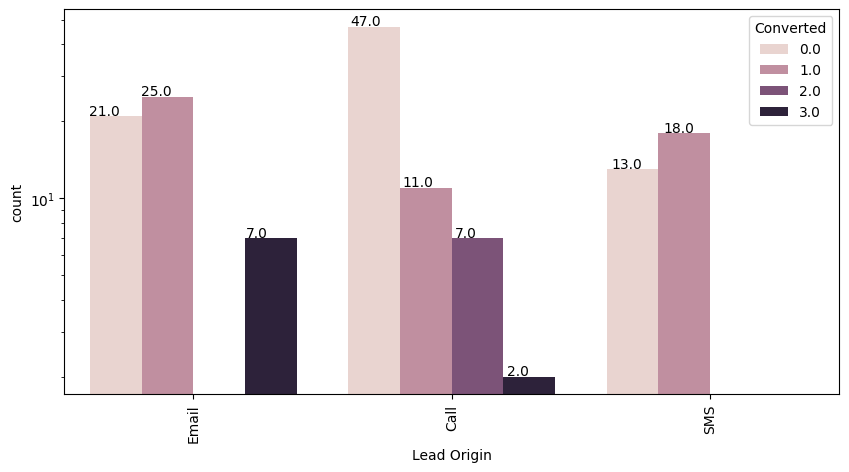

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Lead Origin", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

API and Landing Page Submission have 30-35% conversion rate but count of lead originated from them are considerable.
Lead Add Form has more than 90% conversion rate but count of lead are not very high.
Lead Import are very less in count.

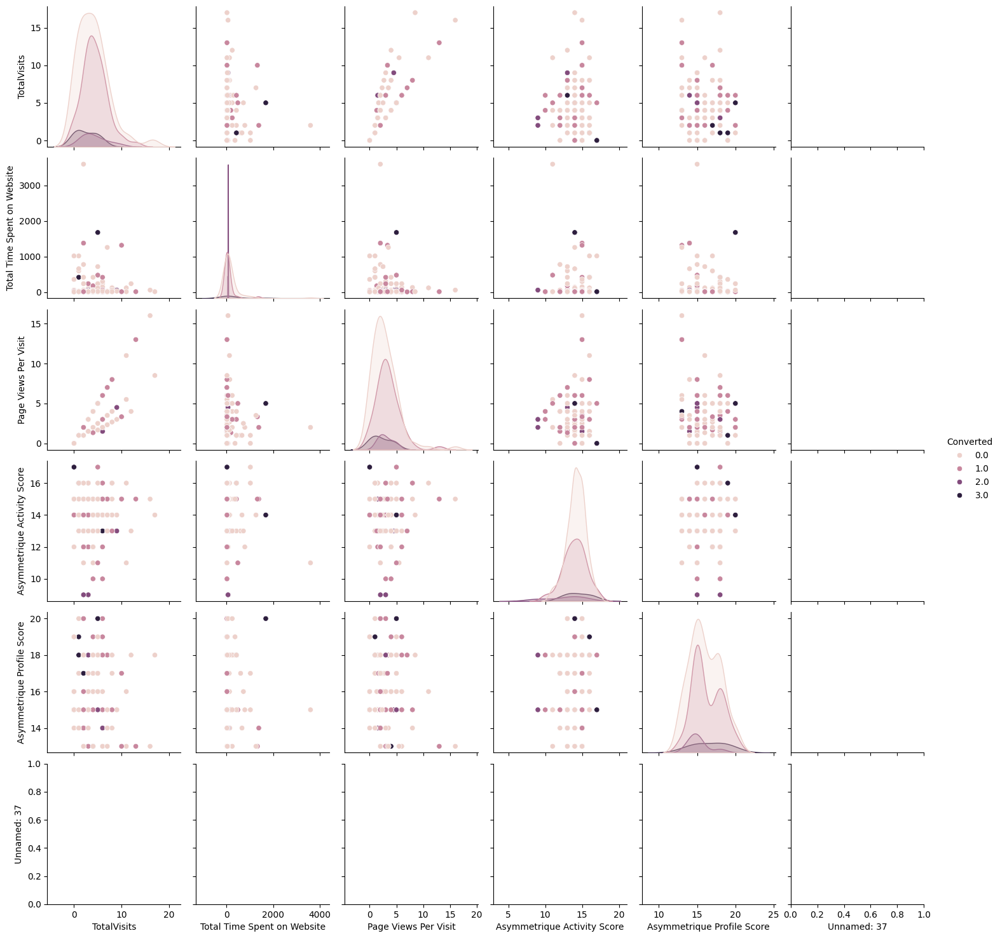

In [ ]:
sns.pairplot(leads,diag_kind='kde',hue='Converted')

To improve overall lead conversion rate, we need to focus more on improving lead converion of API and Landing Page Submission origin and generate more leads from Lead Add Form.

Lead Source¶


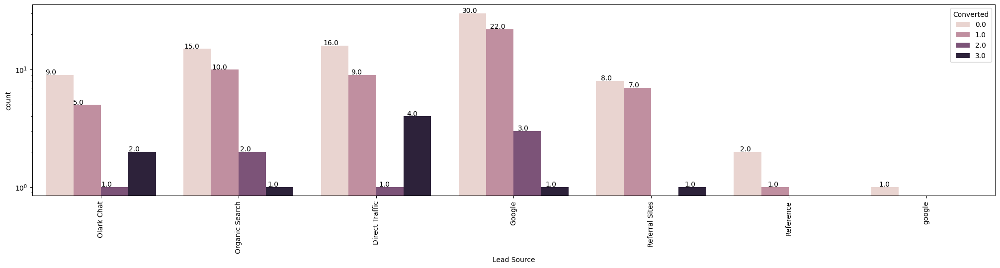

In [ ]:
plt.figure(figsize = (25,5))
ax= sns.countplot(x = "Lead Source", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

In [ ]:
lead['Lead Source'] = lead['Lead Source'].replace(['google'], 'Google')
lead['Lead Source'] = lead['Lead Source'].replace(['Click2call', 'Live Chat', 'NC_EDM', 'Pay per Click Ads', 'Press_Release',
  'Social Media', 'WeLearn', 'bing', 'blog', 'testone', 'welearnblog_Home', 'youtubechannel'], 'Others')

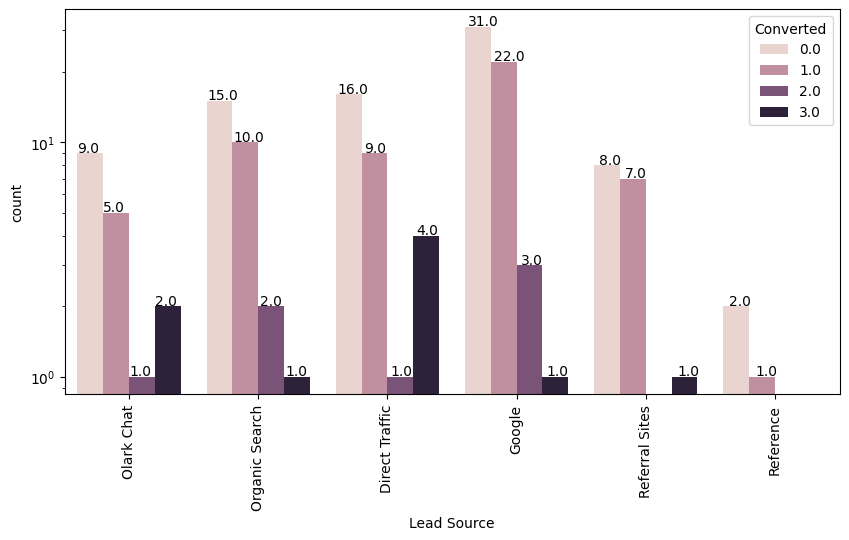

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Lead Source", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Google and Direct traffic generates maximum number of leads.
Conversion Rate of reference leads and leads through welingak website is high.

To improve overall lead conversion rate, focus should be on improving lead converion of olark chat, organic search, direct traffic, and google leads and generate more leads from reference and welingak website.

Do Not Email & Do Not Call

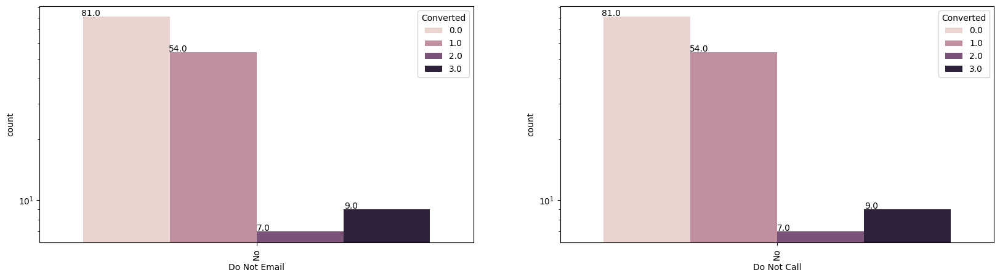

In [ ]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
ax= sns.countplot(x = "Do Not Email", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.subplot(1,2,2)
ax= sns.countplot(x = "Do Not Call", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Total Visits

In [ ]:
lead['TotalVisits'].describe(percentiles=[0.05,.25, .5, .75, .90, .95, .99])

count    178.000000
mean       4.134831
std        3.200251
min        0.000000
5%         0.000000
25%        2.000000
50%        4.000000
75%        6.000000
90%        8.000000
95%       10.150000
99%       13.690000
max       17.000000
Name: TotalVisits, dtype: float64

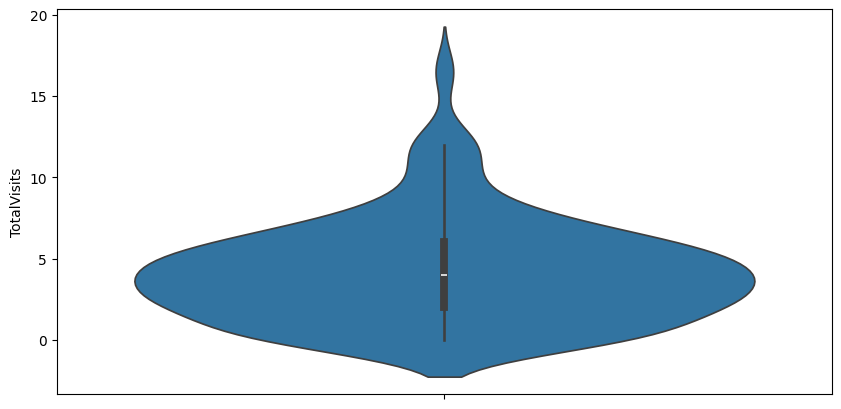

In [ ]:
plt.figure(figsize = (10,5))
sns.violinplot(lead['TotalVisits'])
plt.show()

In [ ]:
# As we can see there are a number of outliers in the data.
# We will cap the outliers to 95% value for analysis.

In [ ]:
percentiles = lead['TotalVisits'].quantile([0.05,0.95]).values
lead['TotalVisits'][lead['TotalVisits'] <= percentiles[0]] = percentiles[0]
lead['TotalVisits'][lead['TotalVisits'] >= percentiles[1]] = percentiles[1]

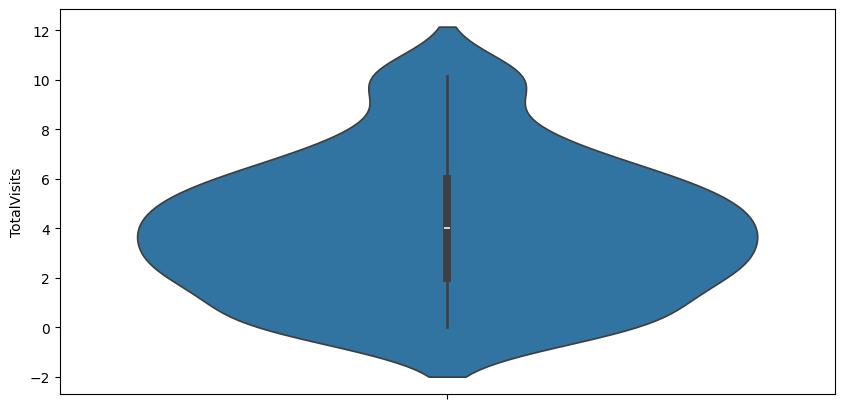

In [ ]:
plt.figure(figsize = (10,5))
sns.violinplot(lead['TotalVisits'])
plt.show()

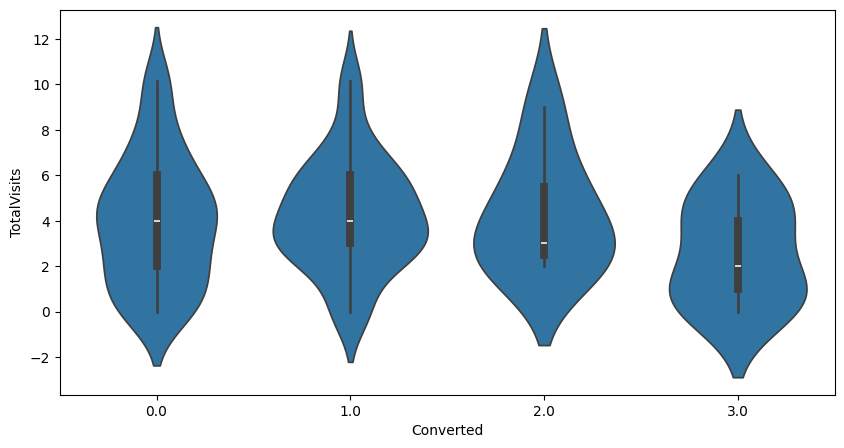

In [ ]:
plt.figure(figsize = (10,5))
sns.violinplot(y = 'TotalVisits', x = 'Converted', data = lead)
plt.show()

Median for converted and not converted leads are the same.

Nothng conclusive can be said on the basis of Total Visits.

Total time spent on website

In [ ]:
lead['Total Time Spent on Website'].describe()

count     176.000000
mean      126.346591
std       369.608301
min        10.000000
25%        15.000000
50%        15.000000
75%        60.000000
max      3600.000000
Name: Total Time Spent on Website, dtype: float64

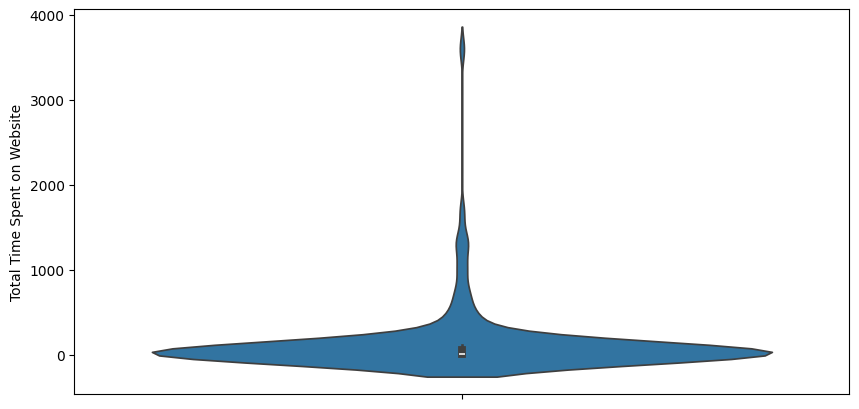

In [ ]:
plt.figure(figsize = (10,5))
sns.violinplot(lead['Total Time Spent on Website'])
plt.show()

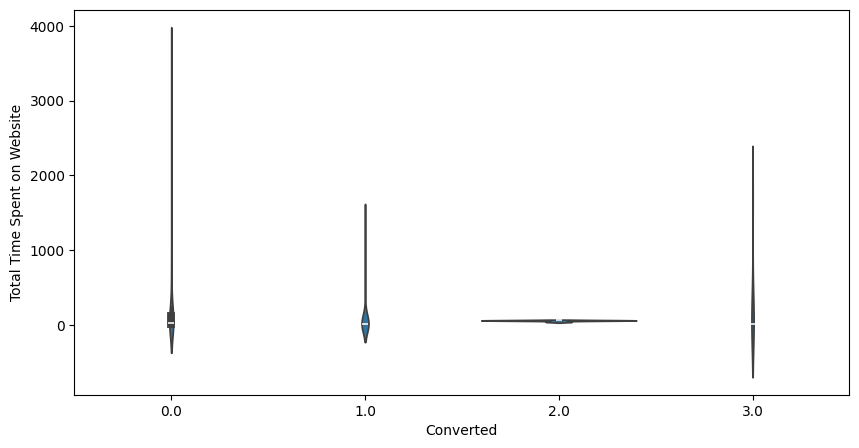

In [ ]:
plt.figure(figsize = (10,5))
sns.violinplot(y = 'Total Time Spent on Website', x = 'Converted', data = lead)
plt.show()

Leads spending more time on the weblise are more likely to be converted.
Website should be made more engaging to make leads spend more time.

Page views per visit

In [ ]:
lead['Page Views Per Visit'].describe()

count    178.000000
mean       3.032978
std        2.465204
min        0.000000
25%        1.500000
50%        2.835000
75%        4.000000
max       16.000000
Name: Page Views Per Visit, dtype: float64

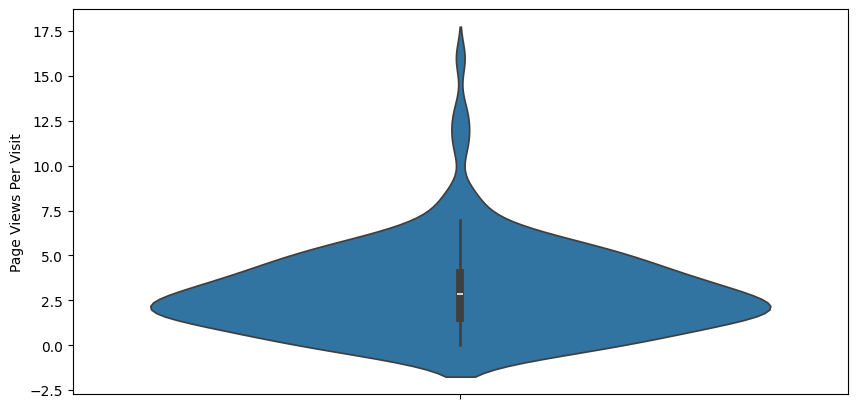

In [ ]:
plt.figure(figsize = (10,5))
sns.violinplot(lead['Page Views Per Visit'])
plt.show()

In [ ]:
# As we can see there are a number of outliers in the data.
# We will cap the outliers to 95% value for analysis.
percentiles = lead['Page Views Per Visit'].quantile([0.05,0.95]).values
lead['Page Views Per Visit'][lead['Page Views Per Visit'] <= percentiles[0]] = percentiles[0]
lead['Page Views Per Visit'][lead['Page Views Per Visit'] >= percentiles[1]] = percentiles[1]

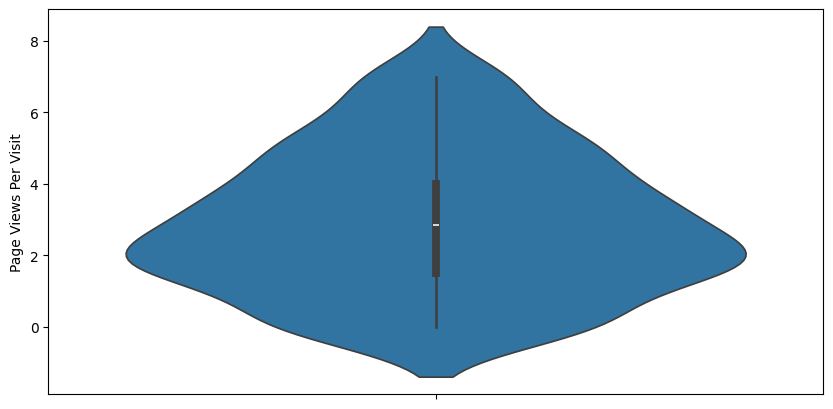

In [ ]:
plt.figure(figsize = (10,5))
sns.violinplot(lead['Page Views Per Visit'])
plt.show()

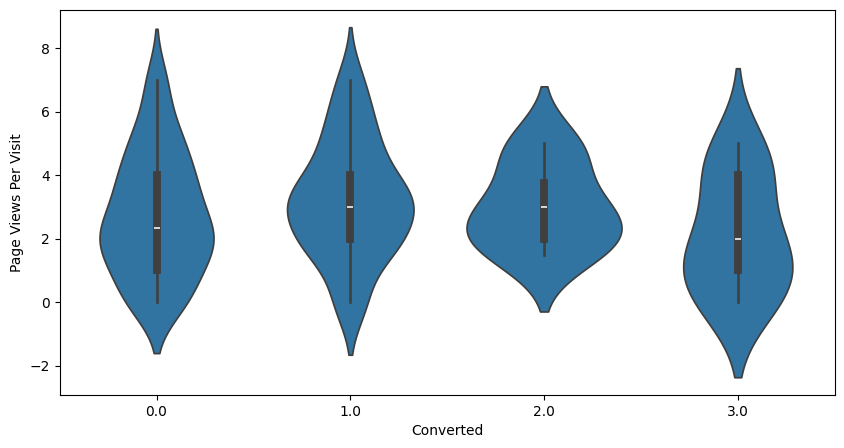

In [ ]:
plt.figure(figsize = (10,5))
sns.violinplot(y = 'Page Views Per Visit', x = 'Converted', data = lead)
plt.show()

Median for converted and unconverted leads is the same.
Nothing can be said specifically for lead conversion from Page Views Per Visit

Last Activity

In [ ]:
lead['Last Activity'].describe()

count               176
unique                3
top       Call Received
freq                 71
Name: Last Activity, dtype: object

In [ ]:
lead['Last Activity'].value_counts()

Call Received    71
Email Open       70
SMS Open         35
Name: Last Activity, dtype: int64

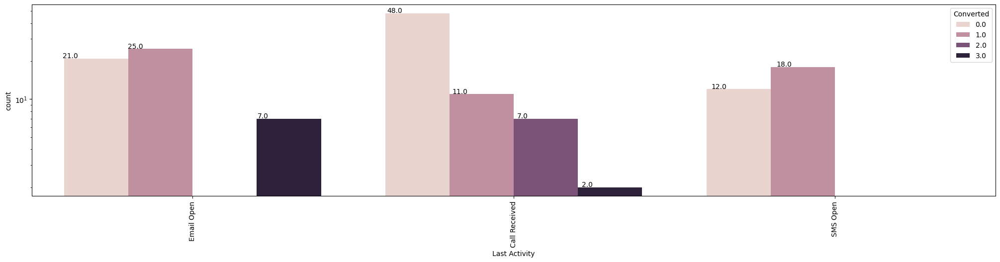

In [ ]:
plt.figure(figsize = (25,5))
ax= sns.countplot(x = "Last Activity", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

In [ ]:
# Let's keep considerable last activities as such and club all others to "Other_Activity"
lead['Last Activity'] = lead['Last Activity'].replace(['Had a Phone Conversation', 'View in browser link Clicked',
                                                       'Visited Booth in Tradeshow', 'Approached upfront',
                                                       'Resubscribed to emails','Email Received', 'Email Marked Spam'],
                                                      'Other_Activity')

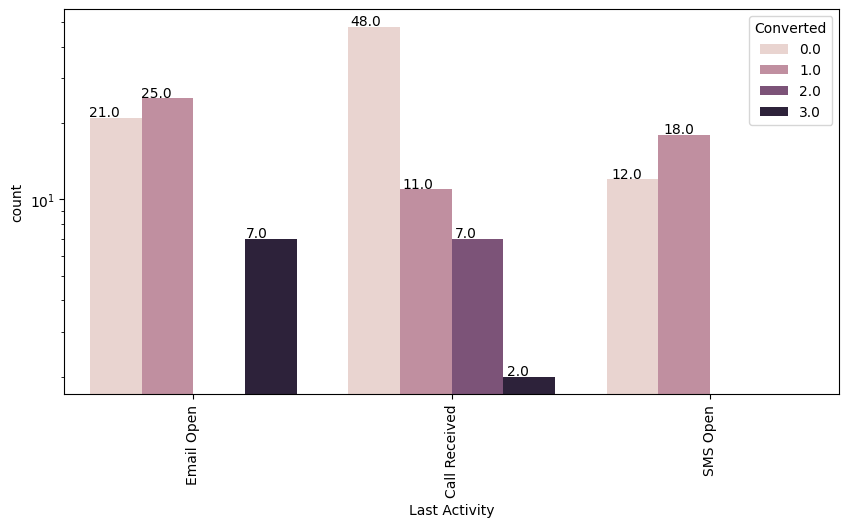

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Last Activity", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most of the lead have their Email opened as their last activity.
Conversion rate for leads with last activity as SMS Sent is almost 62%.

Country

In [ ]:
leads['Country'].describe()

count             183
unique            183
top       Afghanistan
freq                1
Name: Country, dtype: object

In [ ]:
lead.Country.value_counts()

Afghanistan                             1
Mongolia                                1
Libya                                   1
Liechtenstein                           1
Lithuania                               1
Luxembourg                              1
Macau S.A.R.                            1
Macedonia                               1
Madagascar                              1
Malawi                                  1
Malaysia                                1
Maldives                                1
Man (Isle of)                           1
Marshall Islands                        1
Martinique                              1
Mauritania                              1
Mauritius                               1
Mayotte                                 1
Mexico                                  1
Micronesia                              1
Moldova                                 1
Liberia                                 1
Lesotho                                 1
Latvia                            

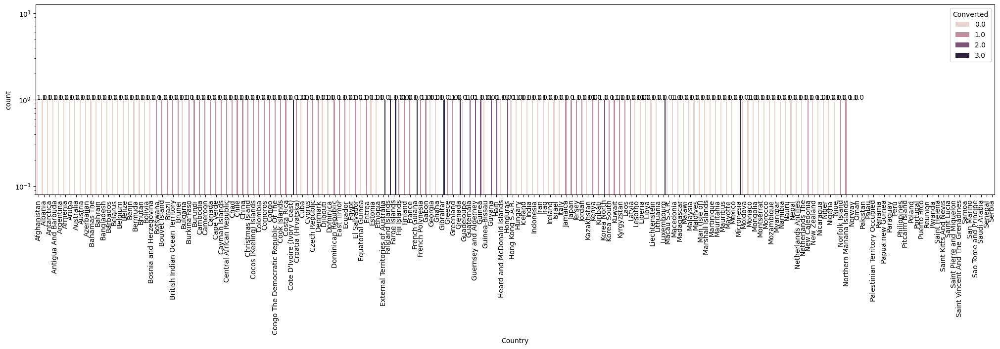

In [ ]:
plt.figure(figsize = (25,5))
ax= sns.countplot(x = "Country", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most values are 'India' , we can tell core business is coming from India market
They have potential to make business from US, Middle East & Europe

Specialization

In [ ]:
lead.Specialization.describe()

count                         178
unique                        178
top       ORGGEN TECHNOLOGIES LLP
freq                            1
Name: Specialization, dtype: object

In [ ]:
lead.Specialization.value_counts()

ORGGEN TECHNOLOGIES LLP                            1
Kunal Laundry                                      1
Supreme Enterprises (workshop)                     1
Swapna Engineering Works                           1
Kamal Engineers                                    1
Highway Cleaning Works                             1
Nitin dry cleaners                                 1
Thakur Cleaners                                    1
The Landry Room                                    1
veena vihar                                        1
Vinit Laundry                                      1
nirmal dry cleaners                                1
Indian Express Laundry & Dry Cleaners              1
Kajal Dyers & Dry Cleaners                         1
New National Cleaners                              1
Nilesh Laundry                                     1
Pawar laundry                                      1
Popular Cleaners                                   1
Super dry                                     

In [ ]:
lead['Specialization'] = lead['Specialization'].replace(['Others'], 'Other_Specialization')

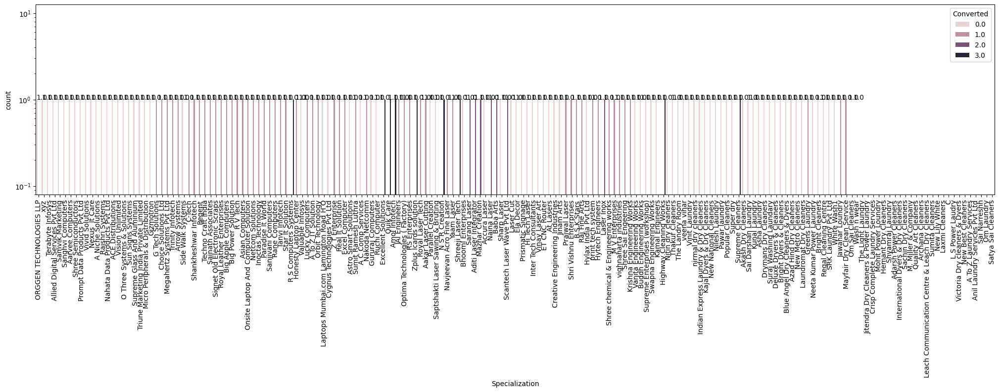

In [ ]:
plt.figure(figsize = (25,5))
ax= sns.countplot(x = "Specialization", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Focus should be more on the Specialization with high conversion rate.
Occupation

In [ ]:
lead['What is your current occupation'].describe()

count            136
unique             4
top       Unemployed
freq             126
Name: What is your current occupation, dtype: object

In [ ]:
lead['What is your current occupation'].value_counts()

Unemployed              126
Working Professional      8
Student                   1
Businessman               1
Name: What is your current occupation, dtype: int64

In [ ]:
lead['What is your current occupation'] = lead['What is your current occupation'].replace(['Other'], 'Other_Occupation')

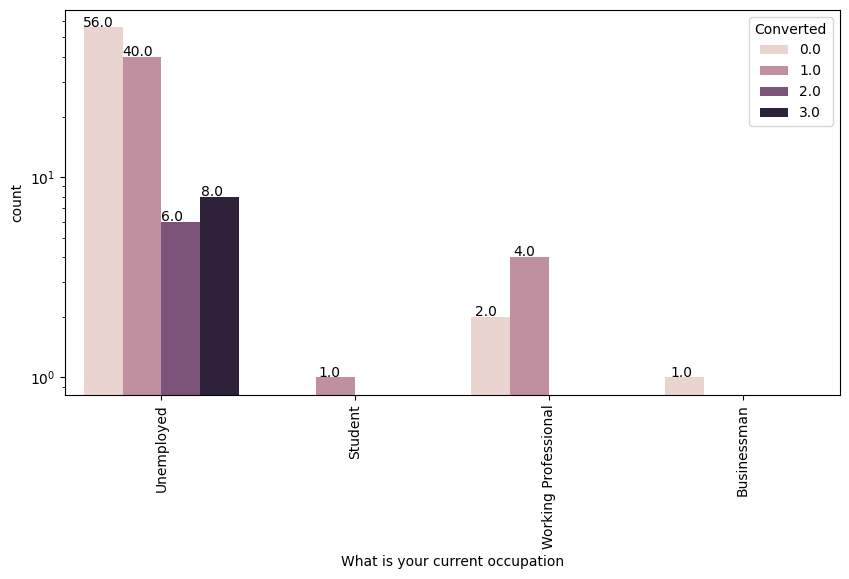

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "What is your current occupation", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Working Professionals going for the course have high chances of joining it.
Unemployed leads are the most in numbers but has around 30-35% conversion rate.
What matters most to you in choosing a course

In [ ]:
lead['What matters most to you in choosing a course'].describe()

count                         136
unique                          1
top       Better Career Prospects
freq                          136
Name: What matters most to you in choosing a course, dtype: object

In [ ]:
lead['What matters most to you in choosing a course'].value_counts()

Better Career Prospects    136
Name: What matters most to you in choosing a course, dtype: int64

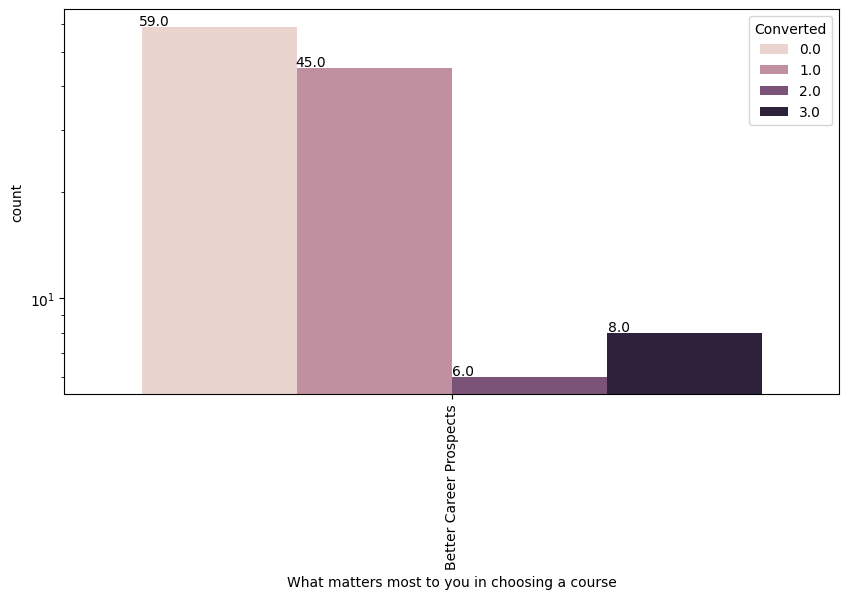

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "What matters most to you in choosing a course", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most entries are 'Better Service Prospects'. No Inference can be drawn with this parameter.
Search

In [ ]:
lead.Search.describe()

count     178
unique      1
top        No
freq      178
Name: Search, dtype: object

In [ ]:
lead.Search.value_counts()

No    178
Name: Search, dtype: int64

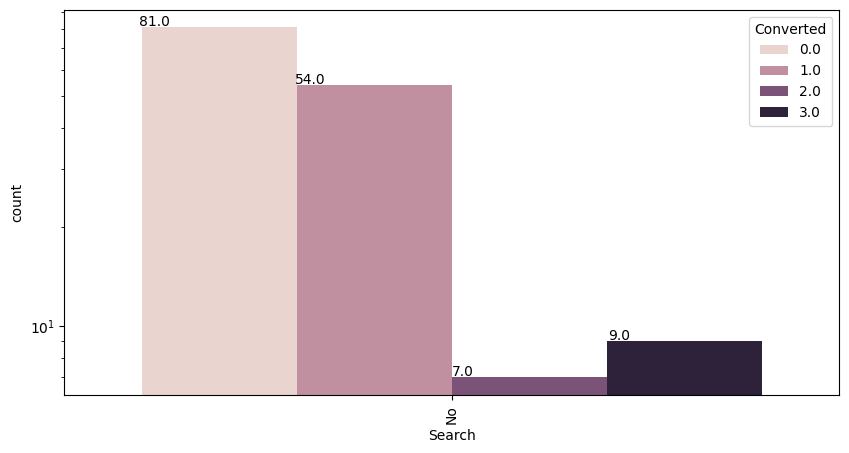

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Search", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most entries are 'No'. No Inference can be drawn with this parameter.
Magazine

In [ ]:
lead.Magazine.describe()

count     178
unique      1
top        No
freq      178
Name: Magazine, dtype: object

In [ ]:
lead.Magazine.value_counts()

No    178
Name: Magazine, dtype: int64

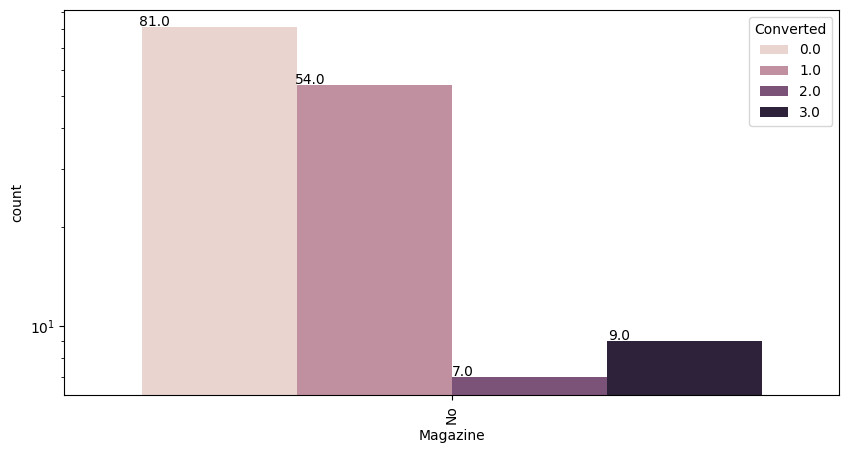

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Magazine", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()


All entries are 'No'. No Inference can be drawn with this parameter.
Newspaper Articlelock



In [ ]:
lead['Newspaper Article'].describe()

count     178
unique      1
top        No
freq      178
Name: Newspaper Article, dtype: object

In [ ]:
lead['Newspaper Article'].value_counts()

No    178
Name: Newspaper Article, dtype: int64

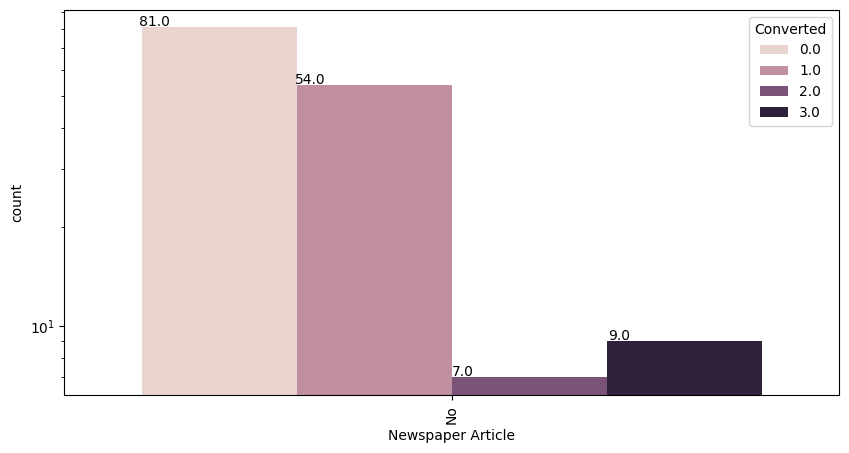

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Newspaper Article", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most entries are 'No'. No Inference can be drawn with this parameter.
X Education Forums

In [ ]:
lead['X Education Forums'].describe()

count     178
unique      1
top        No
freq      178
Name: X Education Forums, dtype: object

In [ ]:
lead['X Education Forums'].value_counts()

No    178
Name: X Education Forums, dtype: int64

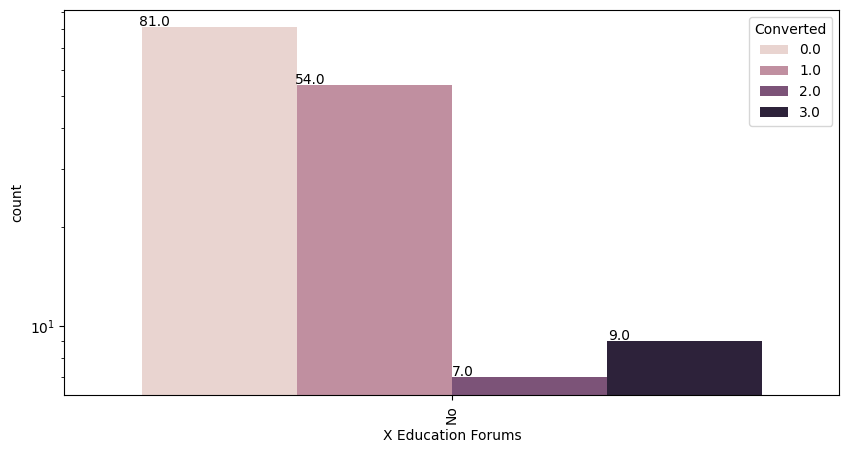

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "X Education Forums", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most entries are 'No'. No Inference can be drawn with this parameter.
Newspaper

In [ ]:
lead['Newspaper'].describe()

count     178
unique      1
top        No
freq      178
Name: Newspaper, dtype: object

In [ ]:
lead['Newspaper'].value_counts()

No    178
Name: Newspaper, dtype: int64

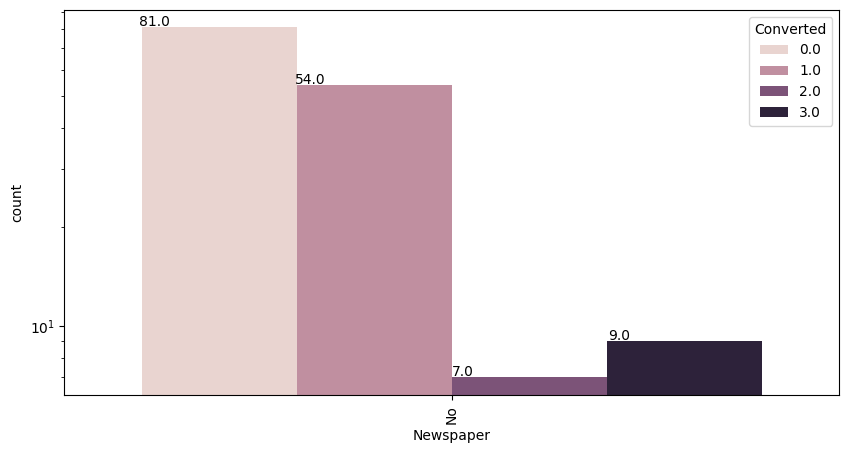

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Newspaper", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most entries are 'No'. No Inference can be drawn with this parameter.
Digital Advertisement

In [ ]:
lead['Digital Advertisement'].describe()

count     178
unique      1
top        No
freq      178
Name: Digital Advertisement, dtype: object

In [ ]:
lead['Digital Advertisement'].value_counts()

No    178
Name: Digital Advertisement, dtype: int64

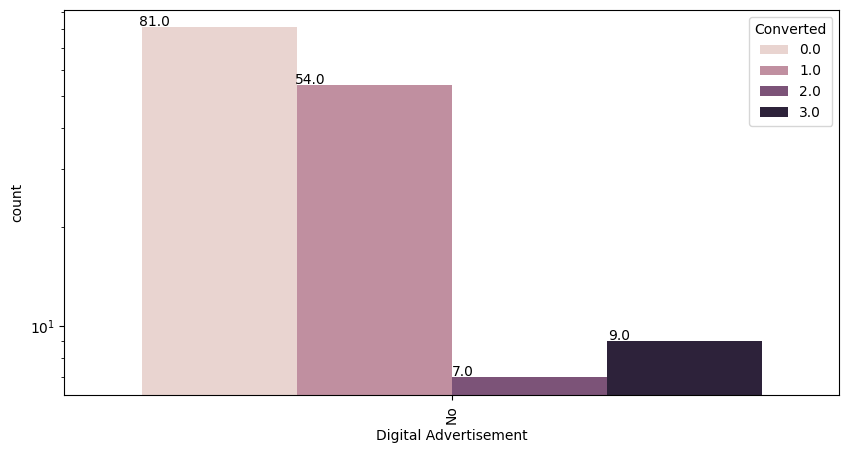

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Digital Advertisement", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most entries are 'No'. No Inference can be drawn with this parameter.
Through Recommendations

In [ ]:
lead['Through Recommendations'].describe()

count     178
unique      1
top        No
freq      178
Name: Through Recommendations, dtype: object

In [ ]:
lead['Through Recommendations'].value_counts()

No    178
Name: Through Recommendations, dtype: int64

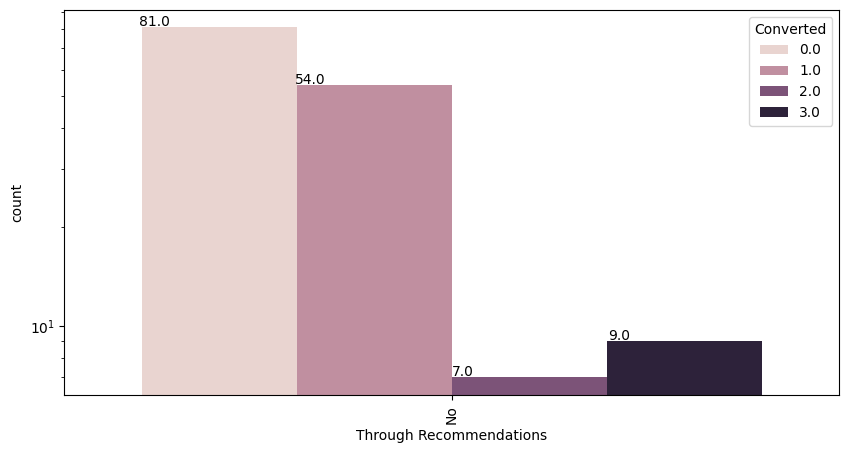

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Through Recommendations", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most entries are 'No'. No Inference can be drawn with this parameter.
Receive More Updates About Our Services

In [ ]:
lead['Receive More Updates About Our Courses'].describe()

count     178
unique      1
top        No
freq      178
Name: Receive More Updates About Our Courses, dtype: object

In [ ]:
lead['Receive More Updates About Our Courses'].value_counts()

No    178
Name: Receive More Updates About Our Courses, dtype: int64

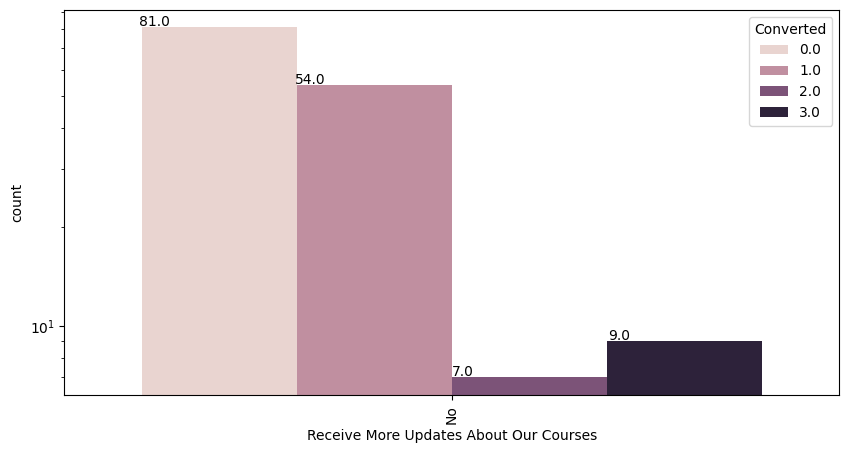

In [ ]:
plt.figure(figsize = (10,5))
ax= sns.countplot(x = "Receive More Updates About Our Courses", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

All entries are 'No'. No Inference can be drawn with this parameter.
Update me on Supply Chain Content

In [ ]:
lead['Update me on Supply Chain Content'].describe()


count     178
unique      1
top        No
freq      178
Name: Update me on Supply Chain Content, dtype: object

In [ ]:
lead['Update me on Supply Chain Content'].value_counts()

No    178
Name: Update me on Supply Chain Content, dtype: int64

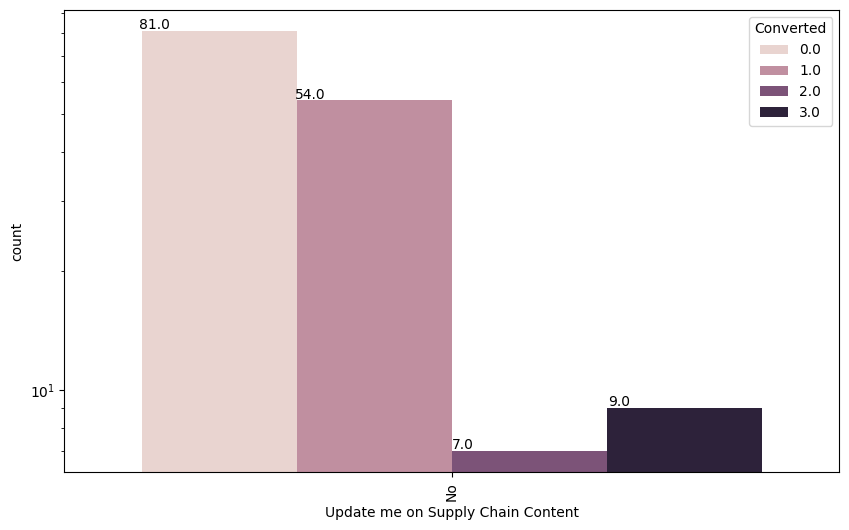

In [ ]:
plt.figure(figsize = (10,6))
ax= sns.countplot(x = "Update me on Supply Chain Content", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

All entries are 'No'. No Inference can be drawn with this parameter.
Get updates on DM Content

In [ ]:
lead['Get updates on DM Content'].describe()

count     176
unique      1
top        No
freq      176
Name: Get updates on DM Content, dtype: object

In [ ]:
lead['Get updates on DM Content'].value_counts()

No    176
Name: Get updates on DM Content, dtype: int64

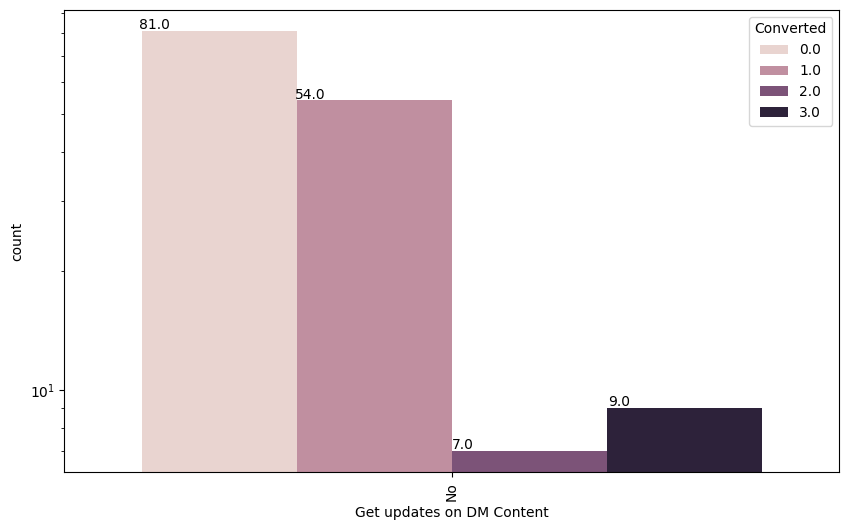

In [ ]:
plt.figure(figsize = (10,6))
ax= sns.countplot(x = "Get updates on DM Content", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

All entries are 'No'. No Inference can be drawn with this parameter.
I agree to pay the amount through cheque

In [ ]:
lead['I agree to pay the amount through cheque'].describe()

count     176
unique      1
top        No
freq      176
Name: I agree to pay the amount through cheque, dtype: object

In [ ]:
lead['I agree to pay the amount through cheque'].value_counts()

No    176
Name: I agree to pay the amount through cheque, dtype: int64

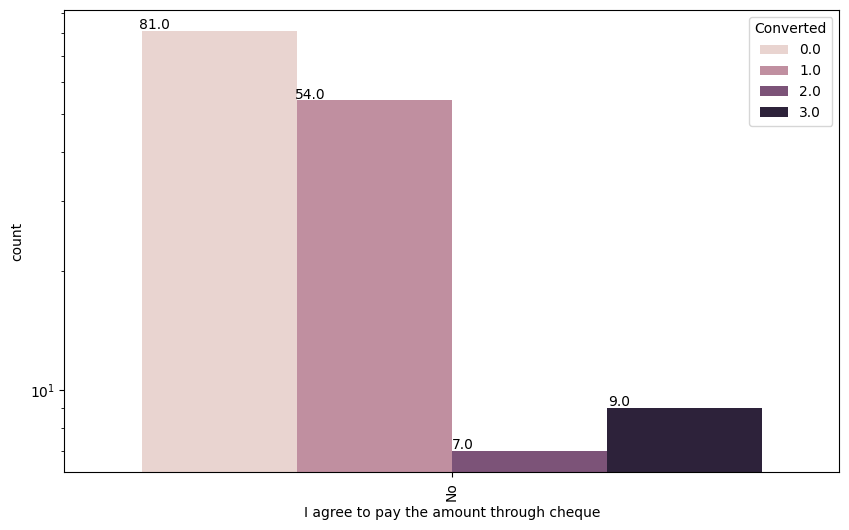

In [ ]:
plt.figure(figsize = (10,6))
ax= sns.countplot(x = "I agree to pay the amount through cheque", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

All entries are 'No'. No Inference can be drawn with this parameter.

A free copy of Mastering The Interview

In [ ]:
lead['A free copy of Mastering The Interview'].describe()

count     176
unique      2
top        No
freq      126
Name: A free copy of Mastering The Interview, dtype: object

In [ ]:
lead['A free copy of Mastering The Interview'].value_counts()

No     126
Yes     50
Name: A free copy of Mastering The Interview, dtype: int64

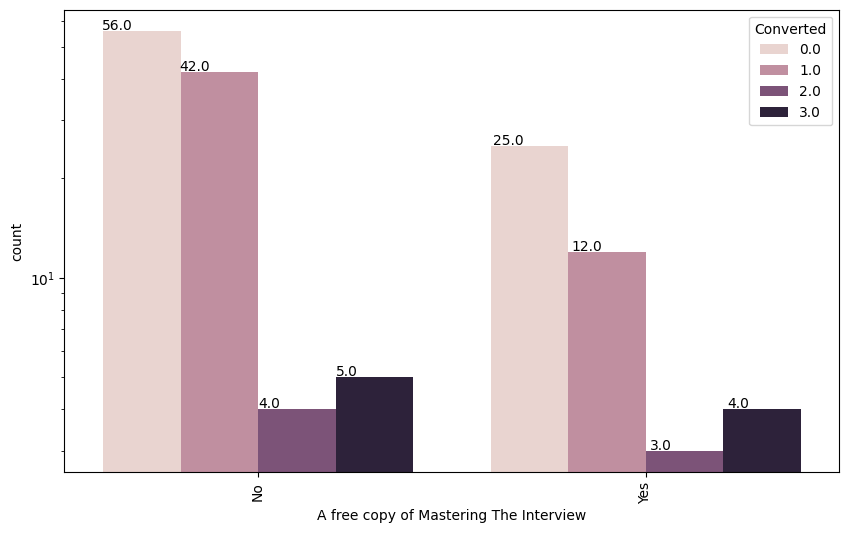

In [ ]:
plt.figure(figsize = (10,6))
ax= sns.countplot(x = "A free copy of Mastering The Interview", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

Most leads are from mumbai with around 30% conversion rate.
Last Notable Activity

In [ ]:
lead['Last Notable Activity'].describe()

count               176
unique                3
top       Call Received
freq                 71
Name: Last Notable Activity, dtype: object

In [ ]:
lead['Last Notable Activity'].value_counts()

Call Received    71
Email Open       70
SMS Open         35
Name: Last Notable Activity, dtype: int64

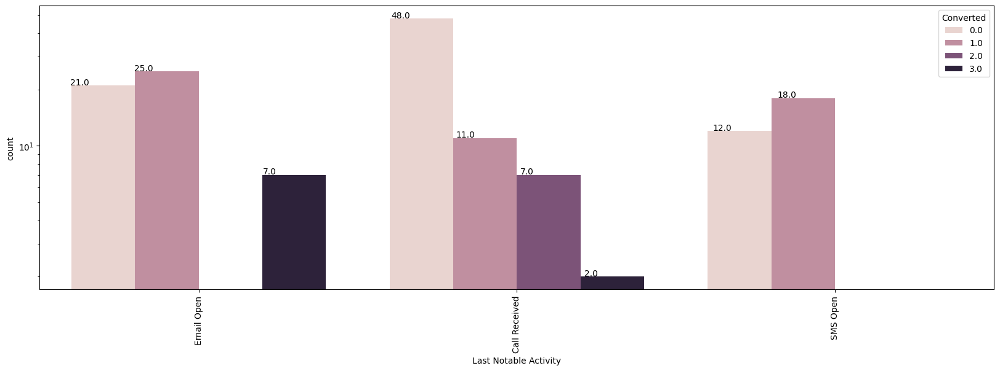

In [ ]:
plt.figure(figsize = (20,6))
ax= sns.countplot(x = "Last Notable Activity", hue = "Converted", data = lead)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(rotation = 90)
ax.set_yscale('log')
plt.show()

SMS Sent' is strong symbol for positive lead
Results

Based on the univariate analysis we have seen that many columns are not adding any information to the model, hence we can drop them for frther analysis

In [ ]:
lead = lead.drop(['What matters most to you in choosing a course','Search',
                  'Magazine','Newspaper Article','X Education Forums','Newspaper',
           'Digital Advertisement','Through Recommendations','Receive More Updates About Our Courses',
                  'Update me on Supply Chain Content',
           'Get updates on DM Content','I agree to pay the amount through cheque',
                  'A free copy of Mastering The Interview','Country'],1)

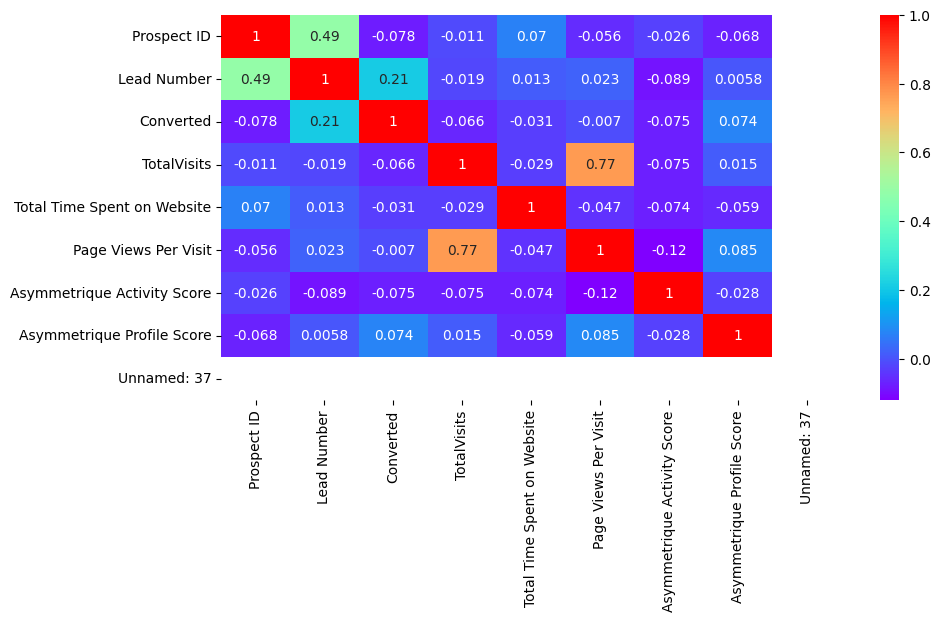

In [ ]:
# Let's check the correlation coefficients to see which variables are highly correlated

plt.figure(figsize = (10,5))
sns.heatmap(lead.corr(), annot = True, cmap="rainbow")
plt.show()

Total Visits & Page Views per Vist are higly correlated with correlation of .77

In [ ]:
print(lead['Last Activity'].value_counts())
print(lead['Last Notable Activity'].value_counts())

Call Received    71
Email Open       70
SMS Open         35
Name: Last Activity, dtype: int64
Call Received    71
Email Open       70
SMS Open         35
Name: Last Notable Activity, dtype: int64


In [ ]:
#Values under 'Last Activity' are coverved as values under 'Last Notable Activity'. Either of one can be dropped.
lead.drop(['Last Notable Activity'], 1, inplace = True)

In [ ]:
print("Original Columns {} % Retained".format(round((100* len(lead.columns)/len(lead_dub.columns)),2)))

Original Columns 55.26 % Retained


In [ ]:
print("Original Rows {} % Retained".format(round((len(lead)*100)/len(lead_dub),2)))

Original Rows 92.23 % Retained


In [ ]:
print("Original Data {} % Retained".format(round((len(lead) *
                                                     len(lead.columns))*100/(len(lead_dub.columns)*len(lead_dub)),2)))

Original Data 50.97 % Retained


In [ ]:
lead.shape

(178, 21)

In [ ]:
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,Lead Quality,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37
0,1,1.0,Email,Olark Chat,No,No,0.0,0.0,15.0,0.0,Email Open,ORGGEN TECHNOLOGIES LLP,Unemployed,Confused,Worst,Bombuflat,02.Medium,02.Medium,15.0,15.0,NaN
1,2,1.0,Email,Organic Search,No,No,0.0,5.0,15.0,2.5,Email Open,xyz,Unemployed,Confused,Worst,Garacharma,02.Medium,02.Medium,15.0,15.0,NaN
7,8,1.0,Email,Olark Chat,No,No,0.0,0.0,15.0,0.0,Email Open,Terabyte Infosys,NaN,Confused,Worst,Aganampudi,02.Medium,02.Medium,15.0,15.0,NaN
8,9,1.0,Email,Direct Traffic,No,No,0.0,2.0,15.0,2.0,Email Open,Allied Digital Services Pvt Ltd,NaN,Confused,Worst,Ajjaram,02.Medium,02.Medium,14.0,14.0,NaN
9,10,1.0,Email,Google,No,No,0.0,4.0,15.0,4.0,Email Open,Samvik Marketing,NaN,Confused,Worst,Akividu,02.Medium,02.Medium,13.0,16.0,NaN


Data Preparation
Converting some binary variables (Yes/No) to 1/0

In [ ]:
# List of variables to map

varlist =  ['Do Not Email', 'Do Not Call']

# Defining the map function
def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the housing list
lead[varlist] = lead[varlist].apply(binary_map)
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,Lead Quality,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37
0,1,1.0,Email,Olark Chat,0.0,0.0,0.0,0.0,15.0,0.0,Email Open,ORGGEN TECHNOLOGIES LLP,Unemployed,Confused,Worst,Bombuflat,02.Medium,02.Medium,15.0,15.0,NaN
1,2,1.0,Email,Organic Search,0.0,0.0,0.0,5.0,15.0,2.5,Email Open,xyz,Unemployed,Confused,Worst,Garacharma,02.Medium,02.Medium,15.0,15.0,NaN
7,8,1.0,Email,Olark Chat,0.0,0.0,0.0,0.0,15.0,0.0,Email Open,Terabyte Infosys,NaN,Confused,Worst,Aganampudi,02.Medium,02.Medium,15.0,15.0,NaN
8,9,1.0,Email,Direct Traffic,0.0,0.0,0.0,2.0,15.0,2.0,Email Open,Allied Digital Services Pvt Ltd,NaN,Confused,Worst,Ajjaram,02.Medium,02.Medium,14.0,14.0,NaN
9,10,1.0,Email,Google,0.0,0.0,0.0,4.0,15.0,4.0,Email Open,Samvik Marketing,NaN,Confused,Worst,Akividu,02.Medium,02.Medium,13.0,16.0,NaN


In [ ]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy1 = pd.get_dummies(lead[['Lead Origin', 'Lead Source', 'Last Activity', 'Specialization','What is your current occupation',
                              'City']], drop_first=True)

dummy1.head()

,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Factory),Specialization_Orbit Technology,Specialization_Paradise It World,Specialization_Parallel Creation,Specialization_Pawar laundry,Specialization_Popular Cleaners,Specialization_Prajwal Laser,Specialization_Prismatic Signage,Specialization_Prompt Data Products Pvt Ltd,Specialization_Quality Art Cleaners,Specialization_Quik Care,Specialization_R S 

In [ ]:
# Adding the results to the master dataframe
lead = pd.concat([lead, dummy1], axis=1)
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,Lead Quality,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Fact

In [ ]:
lead = lead.drop(['Lead Origin', 'Lead Source', 'Last Activity', 'Specialization',
                  'What is your current occupation','City'], axis = 1)

lead.head()

,Prospect ID,Lead Number,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Quality,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Factory),Specialization_Orbit Technology,Specialization_Paradise It World,Specialization_Paral

In [ ]:
lead.shape

(178, 378)

In [ ]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X = lead.drop(['Converted'], axis=1)

In [ ]:
X.head()

,Prospect ID,Lead Number,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Quality,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Factory),Specialization_Orbit Technology,Specialization_Paradise It World,Specialization_Parallel Creati

In [ ]:
X.shape

(178, 377)

In [ ]:
# Putting response variable to y
y = lead['Converted']

In [ ]:
y.head()

0    0.0
1    0.0
7    0.0
8    0.0
9    0.0
Name: Converted, dtype: float64

In [ ]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=333)

In [ ]:
X_train.head()

,Prospect ID,Lead Number,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Quality,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Factory),Specialization_Orbit Technology,Specialization_Paradise It World,Specialization_Parallel Creati

In [ ]:
X_train.shape

(142, 377)

In [ ]:
X_test.head()

,Prospect ID,Lead Number,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Quality,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Factory),Specialization_Orbit Technology,Specialization_Paradise It World,Specialization_Parallel Creati

In [ ]:
X_test.shape

(36, 377)

In [ ]:
y_train.head()

61     1.0
121    0.0
38     1.0
170    NaN
176    NaN
Name: Converted, dtype: float64

In [ ]:
y_train.shape

(142,)

In [ ]:
y_test.head()

43     1.0
103    0.0
20     0.0
32     0.0
182    NaN
Name: Converted, dtype: float64

In [ ]:
y_test.shape

(36,)

Feature Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.fit_transform(X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']])

X_train.head()

,Prospect ID,Lead Number,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Quality,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Factory),Specialization_Orbit Technology,Specialization_Paradise It World,Specialization_Parallel Creati

In [ ]:
# Checking the Converted Rate
Converted = round((sum(lead['Converted'])/len(lead['Converted'].index))*100,2)
print("We have almost {} %  Converted rate after successful data manipulation".format(Converted))

We have almost nan %  Converted rate after successful data manipulation


Model Building

In [ ]:
import statsmodels.api as sm

In [ ]:
y_train

61     1.0
121    0.0
38     1.0
170    NaN
176    NaN
62     1.0
127    0.0
151    0.0
23     0.0
113    1.0
48     1.0
41     1.0
0      0.0
154    0.0
27     1.0
147    0.0
55     1.0
94     2.0
117    1.0
146    0.0
107    1.0
91     2.0
102    0.0
97     0.0
173    NaN
115    1.0
114    2.0
29     1.0
137    0.0
80     0.0
83     3.0
160    0.0
169    NaN
142    3.0
10     0.0
19     0.0
98     0.0
60     1.0
74     1.0
181    NaN
85     1.0
22     0.0
191    NaN
157    0.0
73     1.0
47     1.0
148    0.0
70     3.0
162    1.0
13     0.0
86     3.0
124    0.0
53     1.0
44     1.0
123    0.0
166    NaN
72     1.0
150    0.0
21     0.0
111    0.0
183    NaN
52     3.0
108    1.0
49     1.0
167    NaN
9      0.0
39     1.0
143    0.0
153    0.0
56     1.0
155    1.0
116    1.0
164    NaN
16     0.0
14     0.0
172    NaN
131    0.0
89     2.0
1      0.0
84     1.0
50     1.0
54     0.0
190    NaN
57     1.0
184    NaN
65     0.0
95     0.0
100    0.0
30     1.0
138    0.0
93     2.0

In [ ]:
binary_df = pd.DataFrame({'new_column_name': y_train})

# Perform one-hot encoding on the binary values
binary_df = pd.get_dummies(binary_df, columns=['new_column_name'], prefix='binary')

# Add the one-hot encoded columns to your original dataset
lead = pd.concat([lead, binary_df], axis=1)

In [ ]:
binary_df

,binary_0.0,binary_1.0,binary_2.0,binary_3.0
61,0,1,0,0
121,1,0,0,0
38,0,1,0,0
170,0,0,0,0
176,0,0,0,0
62,0,1,0,0
127,1,0,0,0
151,1,0,0,0
23,1,0,0,0
113,0,1,0,0


In [ ]:
lead

,Prospect ID,Lead Number,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Quality,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Factory),Specialization_Orbit Technology,Specialization_Paradise It World,Specialization_Paral

In [ ]:
X_train


,Prospect ID,Lead Number,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Quality,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,Unnamed: 37,Lead Origin_Email,Lead Origin_SMS,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Referral Sites,Last Activity_Email Open,Last Activity_SMS Open,Specialization_A Niche Solutions,Specialization_A To Z IT Solution,Specialization_A To Z Laundry Services,Specialization_ACE Distributions,Specialization_Aakar Laser Cutting,Specialization_Aarvee Computers,Specialization_Accura Laser,Specialization_Adarsh Power Cleaners,Specialization_Aditi Laser Integrator,Specialization_Akash Dry Cleaners,Specialization_Allied Digital Services Pvt Ltd,Specialization_Amol Infotech,Specialization_Anil Laundry Services Pvt Ltd,Specialization_Archana Cleaners,Specialization_Arrow Systems,Specialization_Asha Laundry,Specialization_Asian Computers,Specialization_Astro Smart Solutions,Specialization_At Lasers,Specialization_Azad Hind Dry Cleaners,Specialization_B.S.K.Stars,Specialization_Baba Arts,Specialization_Bhoomi Enterprises,Specialization_Big Apple Computers,Specialization_Big Power Solution,Specialization_Blue Angel Dry Cleaners & Dyers,Specialization_Bright Cleaners,Specialization_Bright Dyers & Cleaners,Specialization_Buddh Engineering Works,Specialization_C,Specialization_C-Tech,Specialization_Choice Solutions Ltd,Specialization_Creative Engineering Industries,Specialization_Crisp Complete Laundry Services,Specialization_Cygnus Technologies Pvt Ltd,Specialization_Deluxe Dryers & Cleaners,Specialization_Drymans Dry Cleaners,Specialization_ET CNC Router,Specialization_Ela Decor,Specialization_Excel Computer,Specialization_Excellent Solutions,Specialization_G Tech Solutions,Specialization_Gizmotron,Specialization_Greens Laundry,Specialization_Gururaj Computers,Specialization_Hemant Dry Cleaners,Specialization_Hi Tech Laser,Specialization_Highway Cleaning Works,Specialization_Honesty Laptop Center,Specialization_Hylax India Pvt Ltd,Specialization_Hytech Engineers,Specialization_Indian Express Laundry & Dry Cleaners,Specialization_Inoctas Technology,Specialization_Inter Tech Consultants,Specialization_International Dyers & Dry Cleaners,Specialization_JAI Engineers,Specialization_Jawahar Loundry,Specialization_Jinam Arts,Specialization_Jitendra Dry Cleaners & Power Laundry,Specialization_Kajal Dyers & Dry Cleaners,Specialization_Kamal Engineers,Specialization_Krishna Engineering Works,Specialization_Kunal Laundry,Specialization_L S Power Laudry,Specialization_Laptops Mumbai.com Lamington Road H O,Specialization_Laser Cut,Specialization_Laser Inox,Specialization_Laundromat Dry Cleaners,Specialization_Laxmi Cleaners,Specialization_Leach Communication Centre & Leach Dry Cleaners,Specialization_Lucky Computers,Specialization_M V Enterprises,Specialization_M. Miller & Company,Specialization_Mayfair Dry Clean Service,Specialization_Mazhar Creation,Specialization_Megahertz Systems Pvt Ltd,Specialization_Micro Peripherals & Distribution,Specialization_Mohit Power Loundry,Specialization_N S R Creation,Specialization_Nahata Data Products Pvt Ltd,Specialization_Naina Laser,Specialization_Nakoda Netcomm,Specialization_Navjeevan Acro Fine Laser,Specialization_Neeta Kumar Power Laundry,Specialization_Netcom Solutions,Specialization_New Best Cleaners,Specialization_New Lily White,Specialization_New Metro Cleaners,Specialization_New National Cleaners,Specialization_Nexus It Care,Specialization_Nilesh Laundry,Specialization_Nitin dry cleaners,Specialization_O Three Systems & Solutions,Specialization_ORGGEN TECHNOLOGIES LLP,Specialization_Om Laundry,Specialization_Om Sai Cleaners,Specialization_Onsite Laptop And Computer Solution,Specialization_Optima Technologies ( Factory),Specialization_Orbit Technology,Specialization_Paradise It World,Specialization_Parallel Creati

In [ ]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

TypeError: RFE.__init__() takes 2 positional arguments but 3 were given